# Insurance Claims- Fraud Detection

### Problem Statement:

## Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

## GOAL :
To create a predictive model that predicts if an insurance claim is fraudulent or not.

In [1]:
#importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import warnings
warnings.filterwarnings('ignore')

# Importing dataset

In [2]:
#To print all columns
pd.set_option('display.max_columns',None)

In [3]:
#importing dataset
df=pd.read_csv("Automobile_insurance_fraud.csv") #Reading csv file
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [4]:
#Viewing the top 5 rows of the dataset 
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [5]:
#Checking shape of dataset
df.shape

(1000, 40)

In [6]:
#Checking all column names
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

Above are the list of column names in the dataset.

In [7]:
#Checking the data types of all columns
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [8]:
#Checking the info about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In _c39 zero values are non-null which means all the values in the column are nan values so i can drop this column.

In [9]:
#Droping _c39 column
df = df.drop(["_c39"],axis=1)

In [10]:
#Checking unique values of each column
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

policy_number and incident_location both the columns have 1000 unique count which means all the values in this categorical columns are unique so these columns do not have any contribution for model building so let me drop these columns.Insured zip is a code and it has 995 entries they are just codes given to insured person so this has nothing to do with the model training so let me drop it.

In [11]:
#Droping policy_number incident_location column and insured_zip column 
df = df.drop(["policy_number"],axis=1)
df = df.drop(["incident_location"],axis=1)
df = df.drop(["insured_zip"],axis=1)

In [12]:
#Checking null values in the dataset
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_c

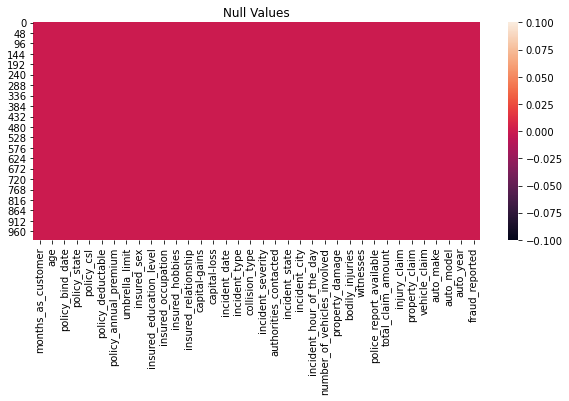

In [13]:
#Visualizeing null values
plt.figure(figsize=[10,4])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

There is no null values in the dataset.

In [14]:
#Checking unique values of target column
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In target column we only have two unique count which means it's a binary classification problem.

In [15]:
#Checking for empty observations
df.loc[df['fraud_reported'] == " "]

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


This shows there are no empty observations in the target column.

In [16]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in df.columns:
        print(df[i].value_counts())
        print('_'*50)

194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
__________________________________________________
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64
__________________________________________________
28-04-1992    3
05-08-1992    3
01-01-2006    3
16-07-2002    2
09-08-2004    2
             ..
04-01-2003    1
17-07-1995    1
03-09-2008    1
20-11-2008    1
15-11-2000    1
Name: policy_bind_date, Length: 951, dtype: int64
__________________________________________________
OH    352
IL    338
IN    310
Na

# Feature engineering

By taking policy_csl column lets extract two other columns.

In [17]:
#Extracting columns from policy_csl
df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

policy_csl was object type data before now i have to convert extracted data from object to int dtype.

In [18]:
#Changing dtype of extracted column
df[['csl_per_person']] = df[['csl_per_person']].astype('int64')
df[['csl_per_accident']] = df[['csl_per_accident']].astype('int64')

In [19]:
#Droping policy_csl column after extraction
df = df.drop(["policy_csl"],axis=1)

In [20]:
#Extracting auto_age from auto year
df['auto_age'] = 2018 - df['auto_year']

In [21]:
#Droping auto_year column after extraction
df = df.drop(["auto_year"],axis=1)

Now i have to extract day,month and yeay from incident_date and policy_bind_date.

In [22]:
#Converting object data type to datetime 
df['policy_bind_date'] =  pd.to_datetime(df['policy_bind_date'])
df['incident_date'] =  pd.to_datetime(df['incident_date'])

In [23]:
#Checking the data types of all columns again
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

In [24]:
#Extracting policy_bind year,month and day from policy_bind_date

#Extracting year
df["policy_bind_year"]=pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.year

#Extracting month
df["policy_bind_month"]=pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.month

#Extracting day
df["policy_bind_day"]=pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.day

In [25]:
#Droping policy_bind_date column after extraction
df = df.drop(["policy_bind_date"],axis=1)

Extracting incident year,month and date from incident_date

In [26]:
#Extracting year
df["incident_year"]=pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.year

#Extracting month
df["incident_month"]=pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.month

#Extracting day
df["incident_date"]=pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.day

In [27]:
#Droping incident_date column after extraction
df = df.drop(["incident_date"],axis=1)

In [28]:
#Checking the dtype now
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available         object
total_claim_amount       

In [29]:
#Checking the value count again
for i in df.columns:
        print(df[i].value_counts())
        print('_'*50)

194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
__________________________________________________
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64
__________________________________________________
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
__________________________________________________
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64
__________________________________________________
1215.36    2
1374.22    2
1389.13    2
1281.25    2
1074.07    2
     

Incident_year has only one unique value so it does not help for model training so let me drop that column.

In [30]:
#Droping incident_year column after extraction
df = df.drop(["incident_year"],axis=1)

Now i have to replace all '?' with there mean values.

In [31]:
#Lets see which columns contains '?'
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

So all these 3 columns contains '?' so i have to replace them with there mean.

In [32]:
# let's check the mode of collision_type column 
df["collision_type"].mode()  # we will fill the '?' values with this mode value

0    Rear Collision
dtype: object

In [33]:
#Replacing '?' with mode value
df['collision_type'] = df.collision_type.str.replace('?', 'Rear Collision')

In [34]:
#Checking the value counts of property_damage column
df.property_damage.value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

So NO is occuring maximum times and NO will be the mode here.I have replace '?' with NO.

In [35]:
#Replacing '?' with mode value
df['property_damage'] = df.property_damage.str.replace('?', 'NO')

In [36]:
#Checking the value counts of police_report_available column
df.police_report_available.value_counts()

NO     343
?      343
YES    314
Name: police_report_available, dtype: int64

So NO is occuring maximum times and NO will be the mode here.I have replace '?' with NO.

In [37]:
#Replacing '?' with mode value
df['police_report_available'] = df.police_report_available.str.replace('?', 'NO')

In [38]:
#lets check dataset after updating
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month
0,328,48,OH,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,250,500,14,2014,10,17,1
1,228,42,IN,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,250,500,11,2006,6,27,1
2,134,29,OH,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,100,300,11,2000,6,9,2
3,256,41,IL,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,250,500,4,1990,5,25,10
4,228,44,IL,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,500,1000,9,2014,6,6,2


In [39]:
#Checking shape now
df.shape

(1000, 39)

Now i have 1000 rows and 39 columns.

In [40]:
#Checking description of data set
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,272.650000,580.200000,12.897000,2001.604000,6.559000,15.448000,3.407000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,161.603196,287.420547,6.015861,7.360391,3.391758,8.850176,3.276291
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,100.000000,300.000000,3.000000,1990.000000,1.000000,1.000000,1.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,100.000000,300.000000,8.000000,1995.000000,4.000000,8.000000,1.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,250.000000,500.000000,13.000000,2002.000000,7.000000,16.000000,2.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,500.000000,1000.000000,18.000000,2008.000000,9.000000,23.000000,5.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,500.000000,1000.000000,23.000000,2015.000000,12.000000,31.000000,12.000000


Describe method will show summary only for numerical columns by default.This will help us to do analysis on outliers/skewness and checking whether null values present in dataset or not by looking into count.By looking into the output i can there are no null values and there are few outliers.

# Visualization

## Univariate Analysis

In [41]:
# Separating categorical columns
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Above are the list of categorical columns.

In [42]:
# Separating numerical columns
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'csl_per_person', 'csl_per_accident', 'auto_age', 'policy_bind_year', 'policy_bind_month', 'policy_bind_day', 'incident_month']


Above are the list of categorical columns.

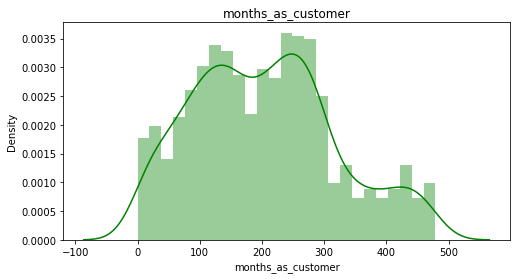

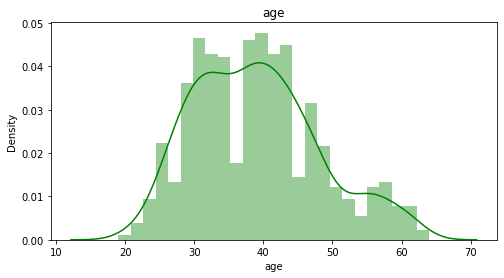

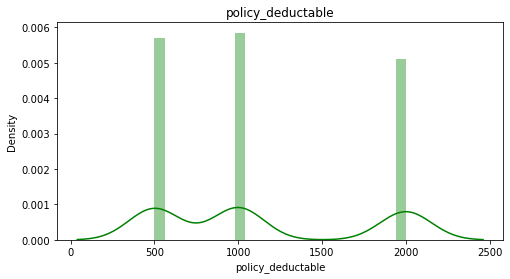

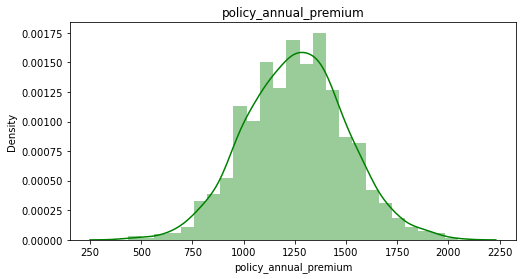

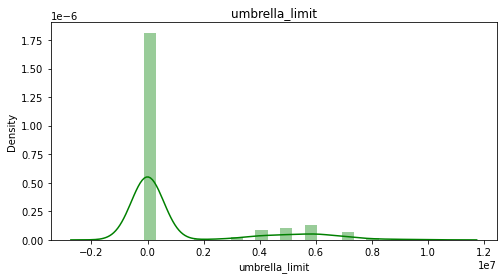

...

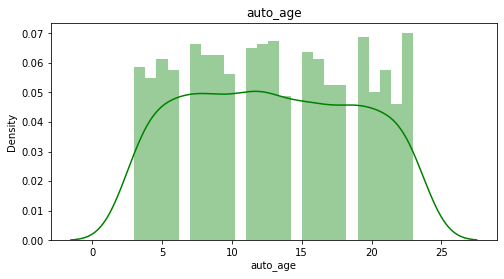

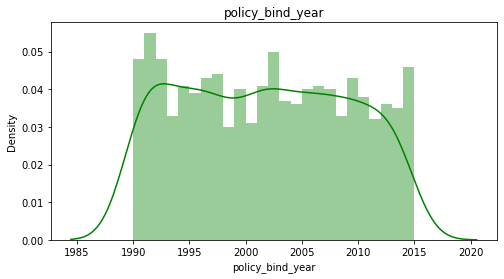

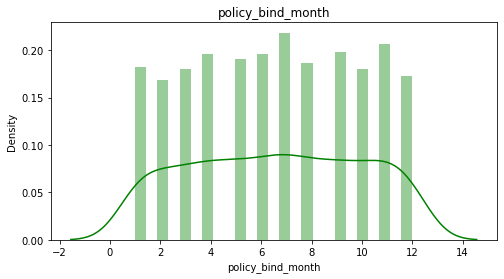

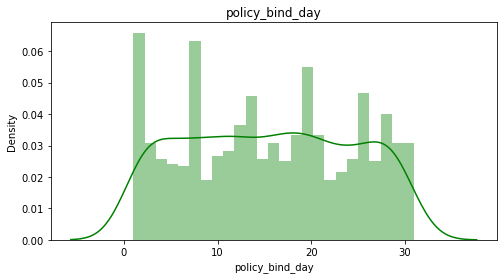

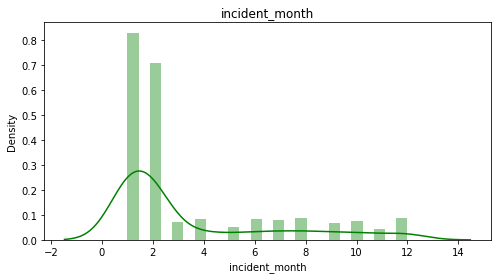

In [43]:
#Distribution plot for all numerical columns
for i in df[numerical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.distplot(df[i], bins = 25, color="g")
    plt.title(i)
    plt.show()

# Observations


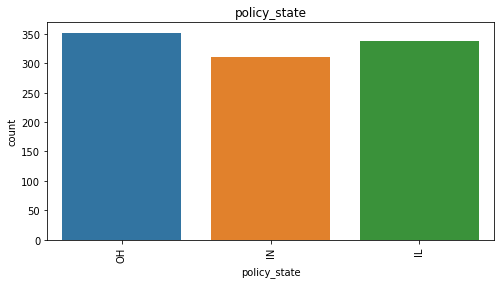

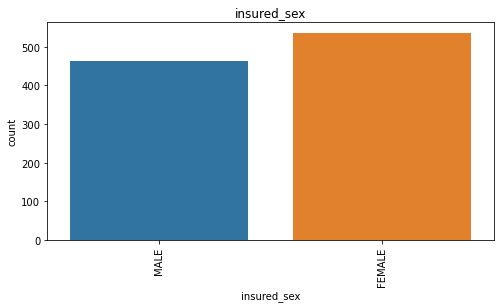

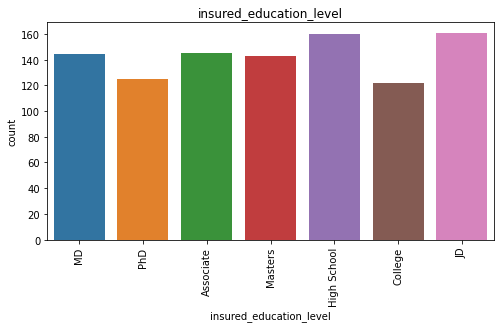

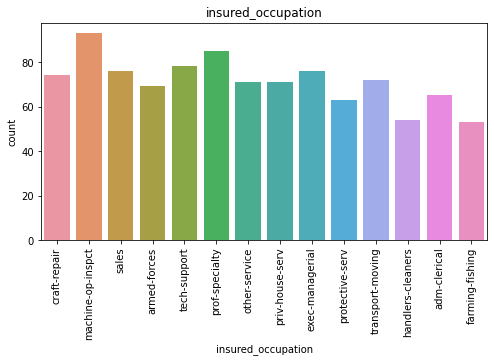

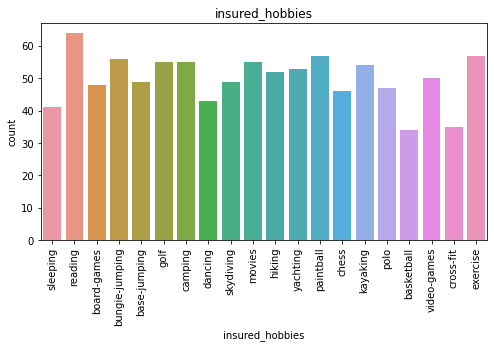

...

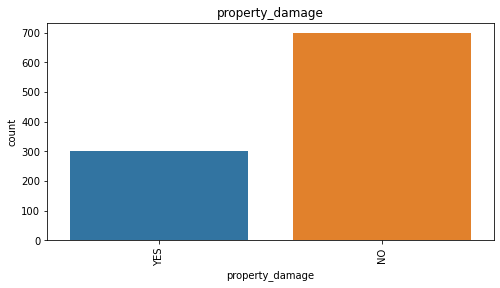

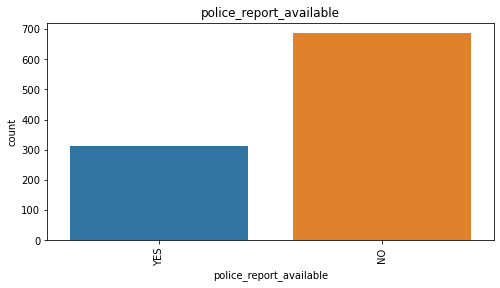

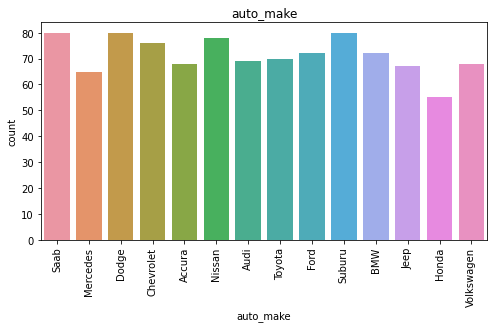

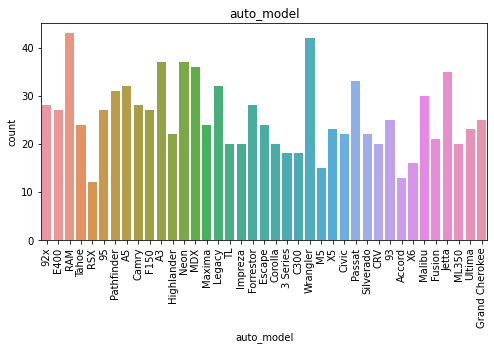

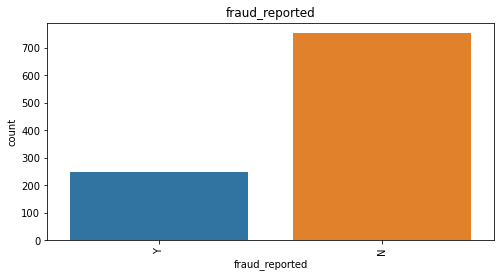

In [44]:
#count plot for all categorical columns
for i in df[categorical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.countplot(df[i])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()


By looking into the count plots below are my observations.

- All the three categories of policy _state look similar where OH policy_state count is high.
- Female insured are slightly more in number than male.
- JD, High school qualified insured are more in number. MD, Associate, Masters stand net to them. Where phD and College have less count compared to others in the column.
- Machine-op-inspct are high in number. Handlers - cleaners are less compared to others. All other occupants are similar in count.
- Most of the insured persons are having reading as their hobby, exercise stands next to it.  Where as less number of the people had basket ball and cross-fit as hobbies. 
- Own-child has maximum count in insured_relationship where all other options had a similar count with Unmaried as least opted one compared to other options.
- Multi-vehicle-collision and single-vehicle-collision are more in number where as Vehicle theft and parked car incidents are fewer in number.
- Rather than front and side collision Rear Collision has maximum count.
- Minor damage has maximum count compared to Trivial damage. Major damage and Total loss stand next to Minor Damage with similar count.
- Police are the majority authorities contacted. None of the authorities were contacted in least number of cases.
- In NY  and SC states most of the cases are registered. Leaset incidents have happened in PA and  OH.
- In all the cities the count of incidents look similar.
- There is very less count for property damage. In majority cases there is no property damage.
- Very less cases have police_report_available. In majority cases there is no police report available 
- The count of all the auto-makers look similar with Saab, Dodge, Nissan, Suburu being the highest
- The models E400 and Wrangler have highest count in auto-model column and RSX has least count compared to all other auto-models
- Most of the cases have no fraud reported. Only fewb have fraud reported.

The count plot of the target column 'Fraud_reported' shows class imbalance. We need to treat this imbalance in the later part.

## Bivariate Analysis:

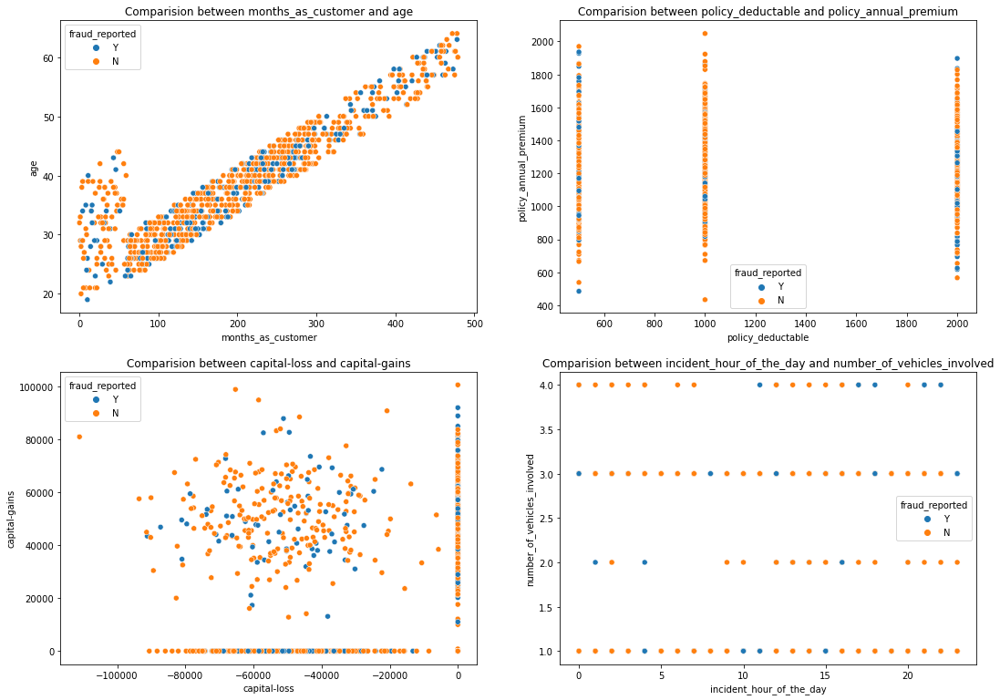

In [45]:
#Comparision between features using scatter plot
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between policy_deductable and policy_annual_premium')
sns.scatterplot(df['policy_deductable'],df['policy_annual_premium'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between capital-loss and capital-gains')
sns.scatterplot(df['capital-loss'],df['capital-gains'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between incident_hour_of_the_day and number_of_vehicles_involved')
sns.scatterplot(df['incident_hour_of_the_day'],df['number_of_vehicles_involved'],hue=df['fraud_reported']);


# Observations
- There is a linear relationship between the age of the person and the months_of_customer, which shows they are directly proportional i.e., as the age increases the months as a customer also increases.
- In second and 3rd plot there is no proper pattern observed.
- In the last plot, incident hours has no specific relation with number of vehicles invovled.

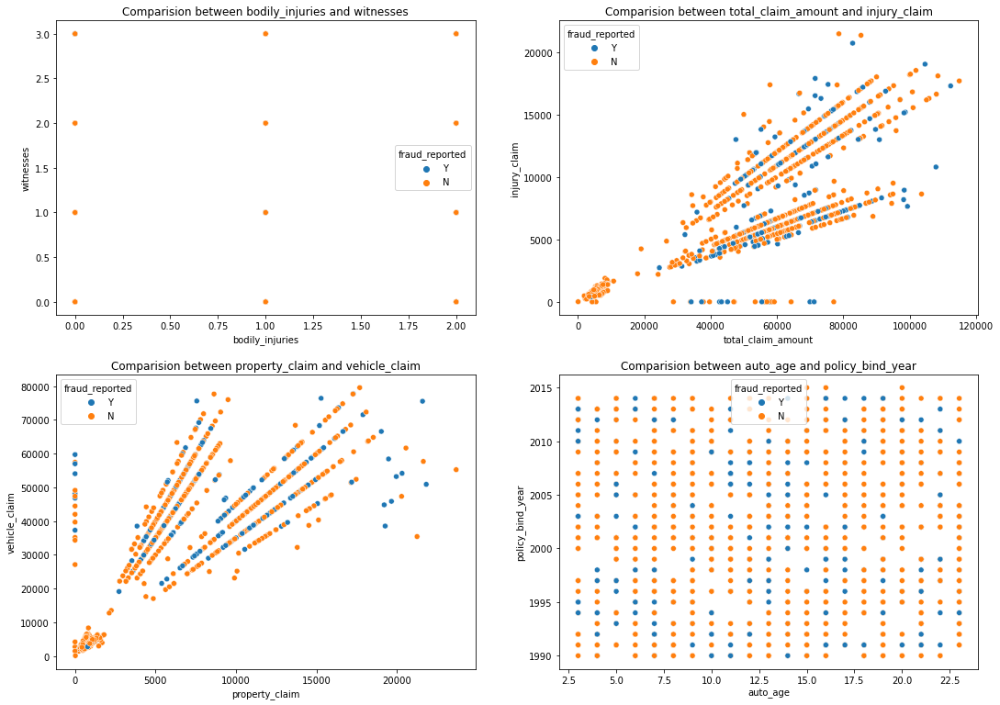

In [46]:
#Comparision between features using scatter plot
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between bodily_injuries and witnesses')
sns.scatterplot(df['bodily_injuries'],df['witnesses'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between auto_age and policy_bind_year')
sns.scatterplot(df['auto_age'],df['policy_bind_year'],hue=df['fraud_reported']);

# Observations
- In first plot it looks very clear that it does not have any fraud detected.
- In second and 3rd plots we can observe a linear relationship where when one variable increases the other also increases.
- In the 4th plot the data is spread all over and it does not show any proper pattern.

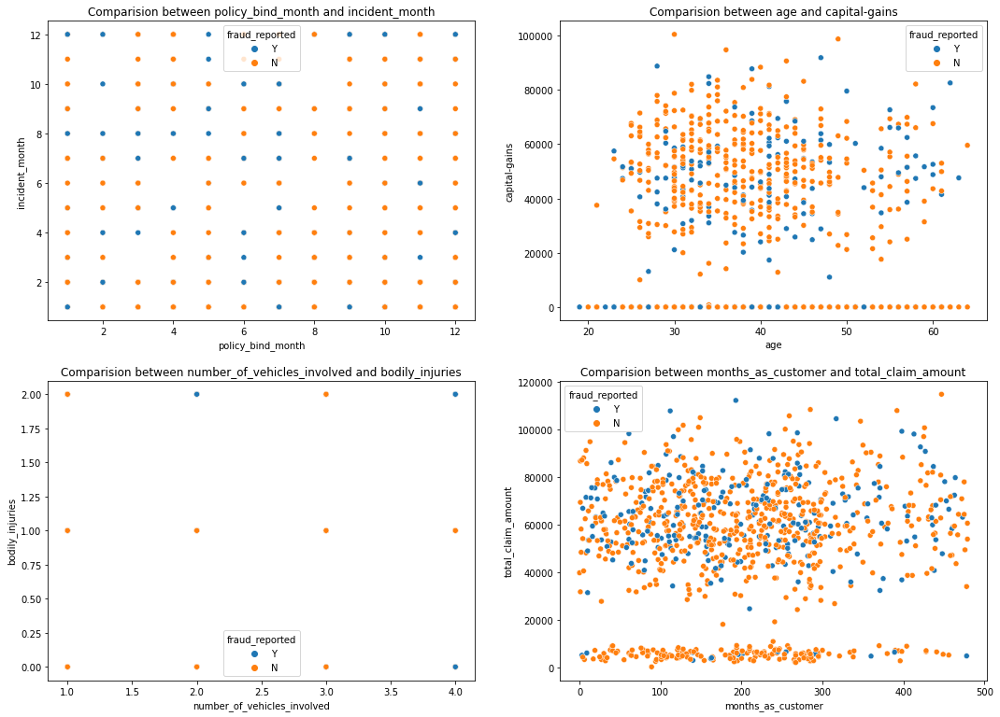

In [47]:
#Comparision between features using scatter plot
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between policy_bind_month and incident_month')
sns.scatterplot(df['policy_bind_month'],df['incident_month'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between age and capital-gains')
sns.scatterplot(df['age'],df['capital-gains'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(df['number_of_vehicles_involved'],df['bodily_injuries'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

# Observations
- In the 1st plot the data is spread all over and it does not show any proper pattern.
- In the 2nd plot for the people aged between 25-45 the capital-gains is high.
- In 3rd plot i can say there are only a few frauds detected.
- In 4th plot the points are denser near 0 claim amount and for the range of 50-300 in month_as_customer the total_claim_amount is high.

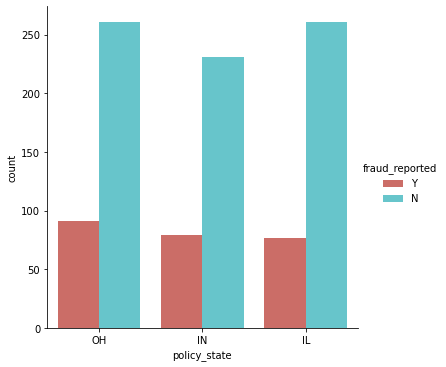

In [48]:
#Factor plot for policy_state
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="hls")
plt.xticks(rotation=0);

# Observations
In all the policy states there are less number of fraud_reported.

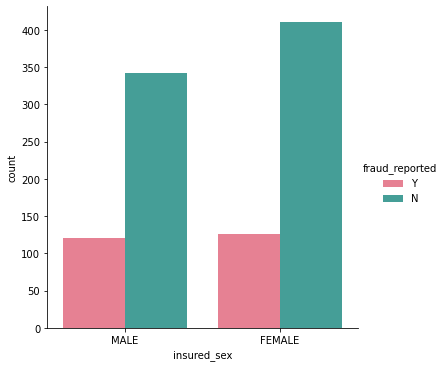

In [49]:
#Factor plot for insured_sex
sns.factorplot('insured_sex',kind='count',data=df,hue='fraud_reported',palette="husl")
plt.xticks(rotation=0);

# Observations
Fraud reported look similar and are comparatively less in both the genders but females have more of no frauds reported than males

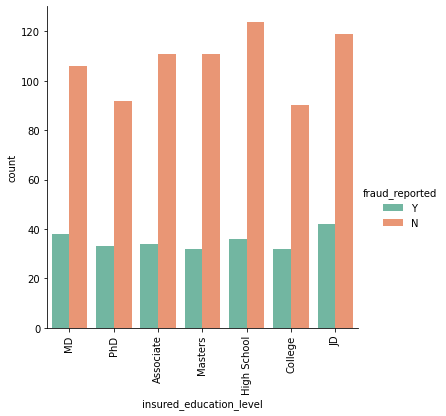

In [50]:
#Factor plot for insured_education_level
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="Set2")
plt.xticks(rotation=90);

# Observations
No fraud reported shows higher counts with all the customers having highschool education. Fraud reported looks similar in all the fields of education with JD being the highest.

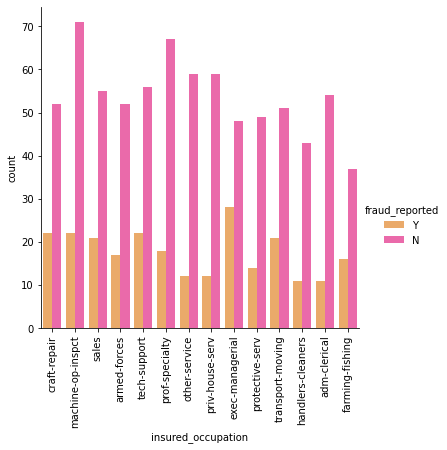

In [51]:
#Factor plot for insured_occupation
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="spring_r")
plt.xticks(rotation=90);

# Observations
- All the occupations have less fraud reported than no fraud reported. 
- 'Machine op inspct' have highest number of no frauds reported cases.
- Other service and priv house serv have lower fraudulent claims than others
- exec- managerial leve of occupants show high number of fraudulent claims, with craft - repair standing next to it/

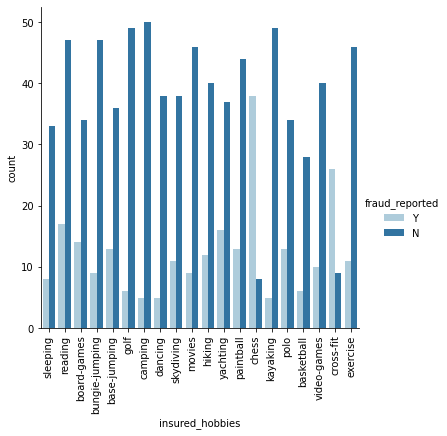

In [52]:
#Factor plot for insured_hobbies
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette="Paired")
plt.xticks(rotation=90);

# Observations
- Customers with chess and cross-fit has maximum number of fraud predicted.
- Camping, dancing and kayaking hobbies have less number of fraud_reported.

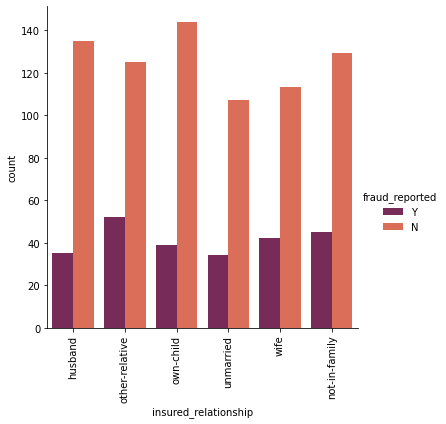

In [53]:
#Factor plot for insured_relationship
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported',palette="rocket")
plt.xticks(rotation=90);

# Observations
- There are fewer frauds reported in the unmarried customers with huband standing next to it as insured relationship.
- Own child has high count of no frauds reported with respect to the insured relationship column.

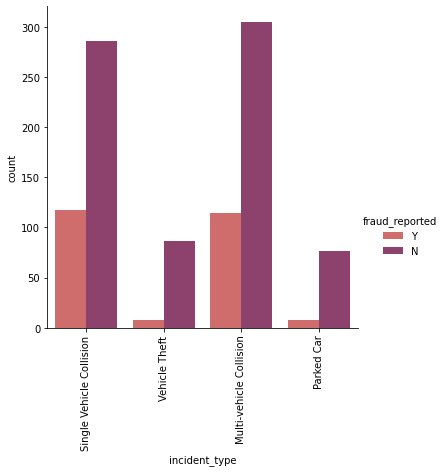

In [54]:
#Factor plot for incident_type
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="flare")
plt.xticks(rotation=90);

# Observations
- The fraud reported is high in multi vehicle collision and single vehicle collision compared to vehicle theft and parked car.
- There are only few fraud reported in the vehicle theft and parked car.

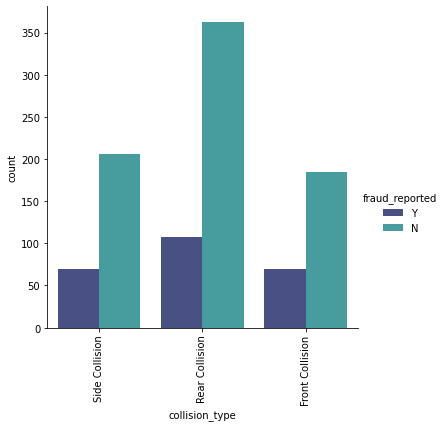

In [55]:
#Factor plot for collision_type
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported',palette="mako")
plt.xticks(rotation=90);

# Observations
- In rear collision the fraud detection is high compared to Side collision and Front collision.
- Also rear collision has higher count of no frauds reported in the collision_type

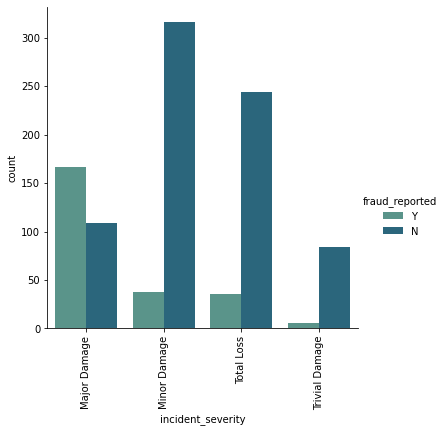

In [56]:
#Factor plot for incident_severity
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported',palette="crest")
plt.xticks(rotation=90);

# Observations
- For major damage type of incident severity the fraud reported is very high compared to other types with Trivial damage having least such cases.

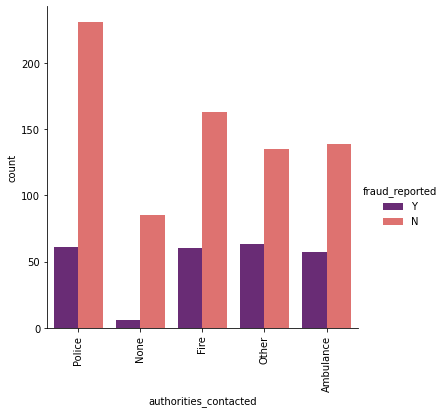

In [57]:
#Factor plot for authorities_contacted
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="magma")
plt.xticks(rotation=90);

# Observations
- In most of the case where police were the authorities contacted there is no fraud reported.
- The fraud reported has equal cases in all the other categories expect where no authorities were contacted being less of all.

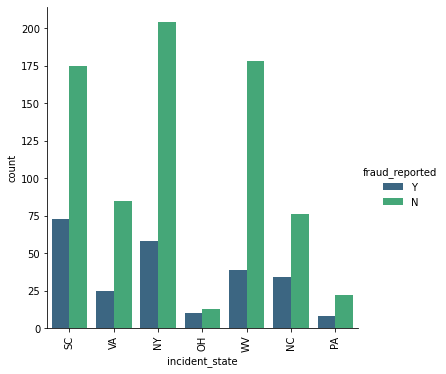

In [58]:
#Factor plot for incident_state
sns.factorplot('incident_state',kind='count',data=df,hue='fraud_reported',palette="viridis")
plt.xticks(rotation=90);

# Observations
- Fraud reported in SC state is high compared to other incident states.
- Fraud reported is least in PA and OH states compared to other incident states.
- There are high number of no fraud reported in the NY state

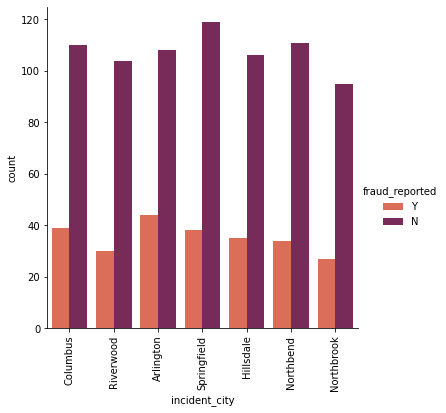

In [59]:
#Factor plot for incident_city
sns.factorplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="rocket_r")
plt.xticks(rotation=90);

# Observations
- In Riverwood and Northbrook the fraud reported is very less compared to other cities.
- Springfield and Columbus have high number of no fraud reported cases.

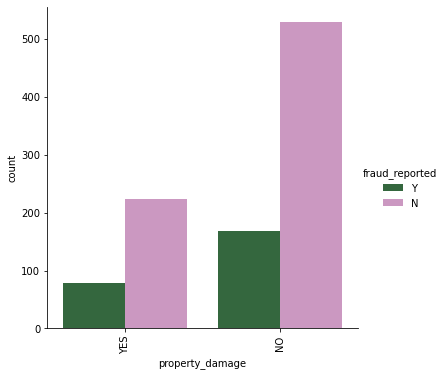

In [60]:
#Factor plot for property_damage
sns.factorplot('property_damage',kind='count',data=df,hue='fraud_reported',palette="cubehelix")
plt.xticks(rotation=90);

# Observations
- In No property damage case the fraud reported is high.
- Also the number of no fraud reported is high in no property damage cases

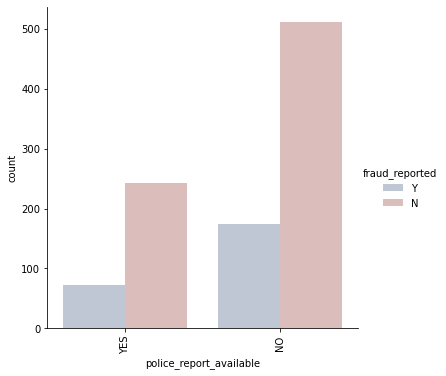

In [61]:
#Factor plot for police_report_available
sns.factorplot('police_report_available',kind='count',data=df,hue='fraud_reported',palette="vlag")
plt.xticks(rotation=90);

# Observations
- There are high Fraud reported in the cases where there is no police report available.
- Also there are more no Fraud reported cases where there is no police report available.

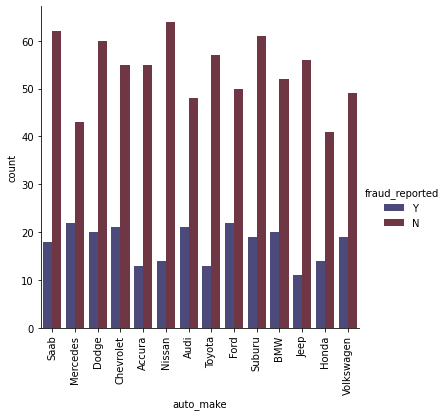

In [62]:
#Factor plot for auto_make
sns.factorplot('auto_make',kind='count',data=df,hue='fraud_reported',palette="icefire")
plt.xticks(rotation=90);

# Observations
- The cases with the nissan auto-makers have highest no frauds reported.
- Jeep auto- maker cases had least fraud reported cases.
- Mercedes, Cheverlet, Audi, Ford as auto-makers have high fraud reported than other auto-makers.

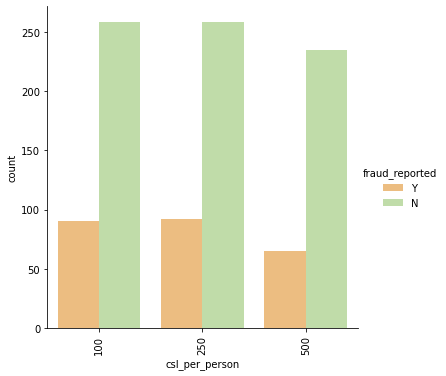

In [63]:
#Factor plot for csl_per_person
sns.factorplot('csl_per_person',kind='count',data=df,hue='fraud_reported',palette="Spectral")
plt.xticks(rotation=90);

# Observations
- There were fewer fraud reports in the 500 as cls_per_person
- There were high no fraud reports in the 100 and 250 as cls_per_person

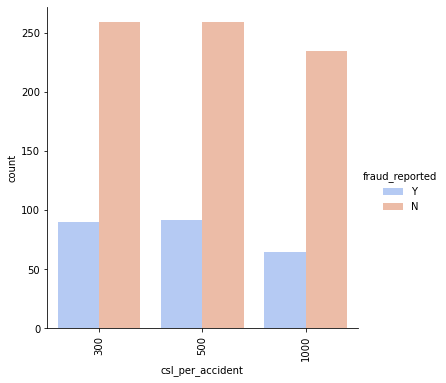

In [64]:
#Factor plot for csl_per_accident
sns.factorplot('csl_per_accident',kind='count',data=df,hue='fraud_reported',palette="coolwarm")
plt.xticks(rotation=90);

# Observations
- There were fewer fraud reports in the 1000 as cls_per_accident
- There were high no fraud reports in the 300 and 550 as cls_per_accident

# Multivariate Analysis:

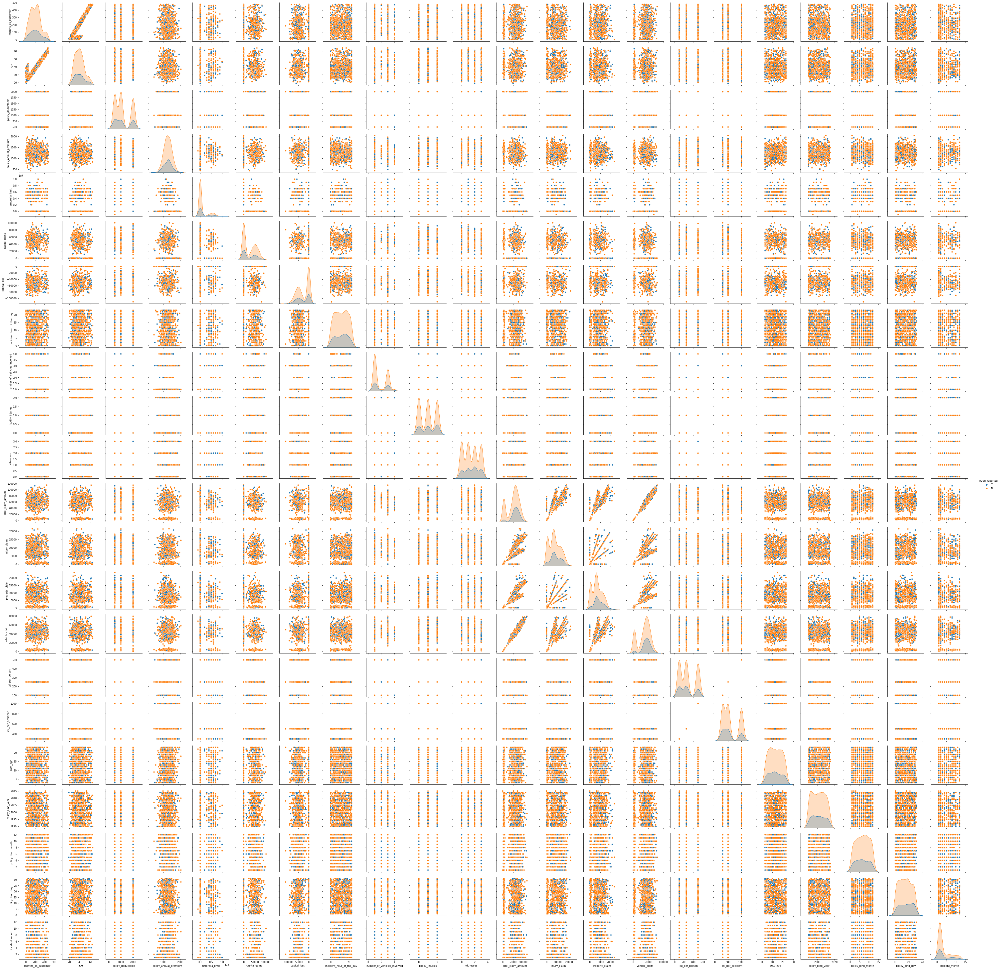

In [65]:
#pair ploting for df
sns.pairplot(df,hue="fraud_reported")

Above is the pair plot for having fraud_reported as target.There are some outliers present in the dataset, which needs to br treated in the later part.

# Data Cleaning

# Checking for outliers

<AxesSubplot:>

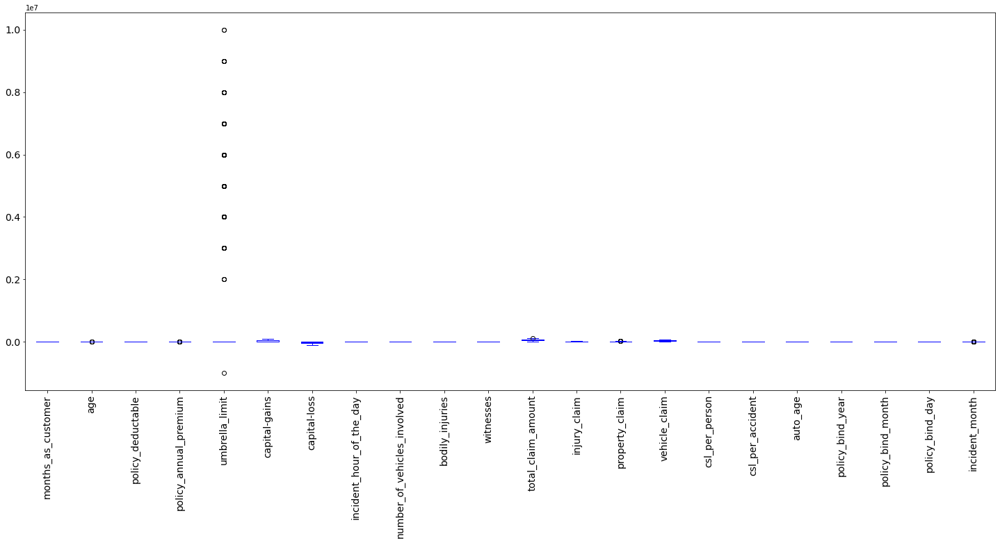

In [66]:
#Checking for outliers using boxplot
df.plot(rot = 90,kind='box',fontsize=14,figsize=(25,10),color='b')

- Outliers are present in the following columns
    - age - (numerical)
    - policy_annual_premium - (numerical)
    - umbrella_limit - (numerical)
    - total_claim_amount - (numerical)
    - property_claim - (numerical)
    - incident_month - (numerical)


- All the above columns with outliers are numerical so we have to remove the outliers in these columns.

# Removing Outliers:

## i) Zscore method:

In [67]:
#Making a list and assigning a variable for all the features having outliers
features=df[['age','policy_annual_premium','umbrella_limit','total_claim_amount','property_claim','incident_month']]

Above are the list of columns with outliers.

In [68]:
# Removing the outliers
from scipy.stats import zscore
z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month
0,328,48,OH,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,250,500,14,2014,10,17,1
1,228,42,IN,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,250,500,11,2006,6,27,1
2,134,29,OH,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,100,300,11,2000,6,9,2
3,256,41,IL,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,250,500,4,1990,5,25,10
4,228,44,IL,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,500,1000,9,2014,6,6,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,0,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,N,500,1000,12,1991,7,16,2
996,285,41,IL,1000,1436.79,0,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,N,100,300,3,2014,5,1,1
997,130,34,OH,500,1383.49,3000000,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,N,250,500,22,2003,2,17,1
998,458,62,IL,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,N,500,1000,20,2011,11,18,2


We have removed the outliers using zscore method.

In [69]:
#Checking shape of new dataset
df_new.shape

(981, 39)

The new dataset has 981 rows and 39 columns.

In [70]:
#Checking shape of old dataset
df.shape

(1000, 39)

The old dataset had 1000 rows and 39 columns.

In [71]:
#Checking dataloss in zscore method
Dataloss = (((1000-981)/1000)*100)
Dataloss

1.9

Using Zscore i have 1.9% data loss.Which is less than 10%.But still let us take a look into IQR method also.

## ii) IQR method:

In [72]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df_1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

We have removed the outliers using IQR method.

In [73]:
#Checking shape of new dataset
df_1.shape

(753, 39)

The new dataset has 753 rows and 39 columns.

In [74]:
#Checking shape of old dataset
df.shape

(1000, 39)

The dataset previously had 1000 rows and 39 columns.

In [75]:
#Checking dataloss in IQR
Dataloss = (((1000-753)/1000)*100)
Dataloss

24.7

In IQR method the dataloss is higher than 10%. So let us stick to zscore method to remove outliers.

# Checking for skewness:

In [76]:
#Checking for skewness
df_new.skew()

months_as_customer             0.363268
age                            0.475942
policy_deductable              0.473431
policy_annual_premium          0.034884
umbrella_limit                 1.803065
capital-gains                  0.465985
capital-loss                  -0.390468
incident_hour_of_the_day      -0.038146
number_of_vehicles_involved    0.506989
bodily_injuries                0.001877
witnesses                      0.024567
total_claim_amount            -0.595242
injury_claim                   0.269442
property_claim                 0.358919
vehicle_claim                 -0.622528
csl_per_person                 0.419579
csl_per_accident               0.615942
auto_age                       0.054033
policy_bind_year               0.062986
policy_bind_month             -0.025056
policy_bind_day                0.026657
incident_month                 1.389884
dtype: float64

There is skewness in the following columns
- umbrella_limit                 
- total_claim_amount
- vehicle_claim
- csl_per_accident
- incident_month

# Removing skewness using yeo-johnson method:

In [77]:
#Creating a list of skewed features
fea=["umbrella_limit","total_claim_amount","vehicle_claim","csl_per_accident","incident_month"]

In [78]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [79]:
# Removing the skewness
df_new[fea] = scaler.fit_transform(df_new[fea].values)

In [80]:
#Checking skewness again
df_new[fea].skew()

umbrella_limit       -7.939425
total_claim_amount   -0.508980
vehicle_claim        -0.522130
csl_per_accident      0.000000
incident_month        0.306126
dtype: float64

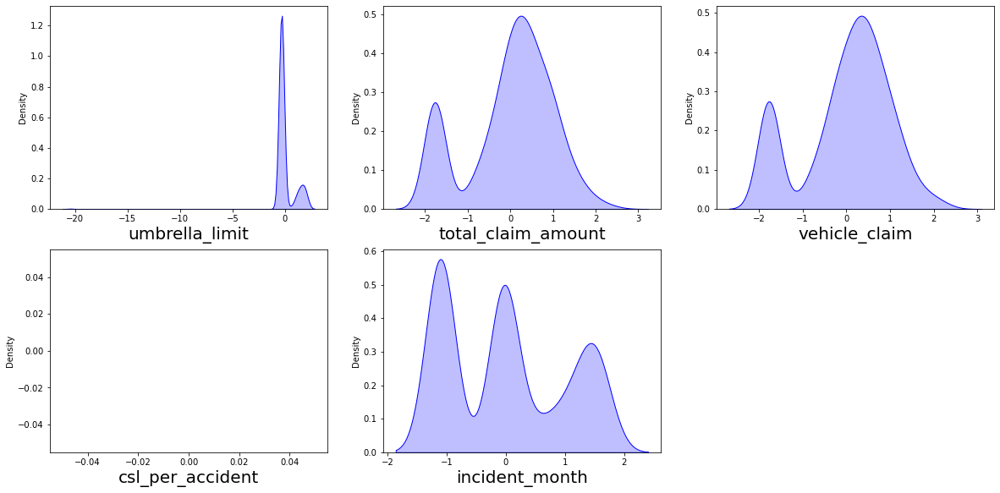

In [81]:
# After removing let's check how the data has been distributed in each column.

plt.figure(figsize=(20,15), facecolor='white')
plotnumber = 1

for column in df_new[fea]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df_new[column],color='b',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

Skewness in all columns is reduced except for the umbrella limit. so it is better to drop this column.

In [83]:
df_new = df_new.drop(["umbrella_limit"],axis=1)

In [84]:
#Checking the skewness after dropping 'umbrella_limit'
df_new.skew()

months_as_customer             0.363268
age                            0.475942
policy_deductable              0.473431
policy_annual_premium          0.034884
capital-gains                  0.465985
capital-loss                  -0.390468
incident_hour_of_the_day      -0.038146
number_of_vehicles_involved    0.506989
bodily_injuries                0.001877
witnesses                      0.024567
total_claim_amount            -0.508980
injury_claim                   0.269442
property_claim                 0.358919
vehicle_claim                 -0.522130
csl_per_person                 0.419579
csl_per_accident               0.000000
auto_age                       0.054033
policy_bind_year               0.062986
policy_bind_month             -0.025056
policy_bind_day                0.026657
incident_month                 0.306126
dtype: float64

Now all the columns have the skewness in the limits 0.5 and -0.5. Hence we can proceed with the next step

# Label Encoding:

In [85]:
# Separating categorical columns in df_new
cat_col=[]
for i in df_new.dtypes.index:
    if df_new.dtypes[i]=='object':
        cat_col.append(i)
print(cat_col)

['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Above is the list of categorical columns in the new dataset.

In [86]:
# Transforming all the columns with categorical data into numerical values using label encoding
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
df_new[cat_col]= df_new[cat_col].apply(LE.fit_transform)

In [87]:
df_new[cat_col].head()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


Using label encoder we have encoded the categorical columns.

# Correlation

In [88]:
#Assigning a variable to check the correlation between the features and the target
cor=df_new.corr()

In [89]:
# Checking correlation
cor

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month
months_as_customer,1.000000,0.922960,-0.007179,0.030777,-0.003875,0.059770,-0.000735,0.006786,-0.089267,0.071304,0.007126,0.023429,-0.016557,-0.073025,-0.064059,0.013999,0.015973,-0.006837,0.066370,0.011635,-0.000521,-0.007870,0.063289,-0.017084,0.059193,0.064864,0.036471,0.056256,0.049912,0.005350,0.021375,-0.021119,NaN,-0.001145,-0.042040,0.004185,0.050537,0.015392
age,0.922960,1.000000,-0.020009,0.031851,0.005290,0.073857,0.001645,0.014703,-0.079038,0.075993,-0.004735,0.013125,-0.026152,-0.076321,-0.064373,0.018575,0.012750,-0.006838,0.083785,0.020254,-0.008165,-0.012377,0.056159,-0.018058,0.068347,0.077002,0.062231,0.059056,0.033873,0.015456,0.013338,-0.014020,NaN,-0.005767,-0.031790,0.014477,0.052939,0.014692
policy_state,-0.007179,-0.020009,1.000000,0.017559,0.015079,-0.017970,-0.027173,-0.025369,-0.039484,-0.017075,0.068431,-0.031703,0.032381,0.049962,-0.028347,-0.014597,0.019472,-0.002843,0.021938,-0.045513,-0.013556,0.012057,0.025779,0.065318,-0.015077,-0.048189,-0.006442,-0.006424,0.010283,-0.017956,0.034595,-0.003297,NaN,0.001116,-0.003066,0.073689,-0.000618,0.027477
policy_deductable,0.030777,0.031851,0.017559,1.000000,-0.007754,-0.008308,0.014117,-0.052613,-0.002614,-0.017619,0.034437,-0.023815,-0.033806,-0.055969,-0.016628,0.000736,-0.000849,-0.045075,0.062384,0.047898,0.012108,-0.035434,0.073531,0.035254,0.025521,0.039835,0.072395,0.005720,-0.029963,-0.004556,0.014936,0.011262,NaN,-0.028073,-0.052713,-0.053964,0.015411,-0.002946
policy_annual_premium,-0.003875,0.005290,0.015079,-0.007754,1.000000,0.040936,-0.021390,0.028133,-0.014407,0.004772,-0.006036,0.031833,0.051156,0.032590,-0.013984,-0.054902,0.048222,0.048277,-0.007023,-0.044075,0.076173,0.028279,0.003949,0.032145,-0.000647,-0.023726,-0.013674,0.009414,0.008776,-0.038708,-0.012900,0.030080,NaN,0.043022,0.002764,-0.031555,-0.032105,-0.013819
insured_sex,0.059770,0.073857,-0.017970,-0.008308,0.040936,1.000000,0.010044,-0.008228,-0.020458,0.003590,-0.021666,-0.027307,0.010566,-0.019007,-0.021047,0.020735,-0.021511,0.008535,0.014340,0.017744,0.033243,-0.016346,0.037991,0.014814,-0.017697,0.007515,-0.009709,-0.024160,0.021281,-0.017329,0.021111,-0.014914,NaN,0.031674,-0.032032,-0.003249,0.046269,0.036656
insured_education_level,-0.000735,0.001645,-0.027173,0.014117,-0.021390,0.010044,1.000000,-0.025367,0.025215,-0.028640,0.044229,0.036835,0.005828,-0.022368,-0.010933,-0.015515,-0.007839,-0.022445,-0.053951,0.003301,-0.050925,-0.017920,0.021756,0.055758,0.079635,0.086578,0.062218,0.072648,0.059955,0.042665,0.013102,0.008466,NaN,-0.054323,0.016886,-0.011960,0.018987,0.064526
insured_occupation,0.006786,0.014703,-0.025369,-0.052613,0.028133,-0.008228,-0.025367,1.000000,-0.010781,-0.011324,0.002101,-0.018662,0.002824,0.012360,-0.000679,-0.002197,-0.021625,0.004368,-0.022929,-0.014657,-0.021466,0.000822,-0.015252,-0.025143,0.009038,0.025668,0.010904,0.003097,0.043096,0.013966,-0.000208,0.015640,NaN,0.000520,-0.025706,0.020795,0.004582,0.010360
insured_hobbies,-0.089267,-0.079038,-0.039484,-0.002614,-0.014407,-0.020458,0.025215,-0.010781,1.000000,-0.096292,0.053382,-0.028457,0.013240,0.019829,-0.023934,-0.027361,0.080200,0.018859,0.017908,0.006922,0.034357,0.026264,-0.037599,-0.034337,-0.001839,0.030864,0.010105,-0.014024,-0.000303,0.035454,-0.047887,-0.009270,NaN,0.017505,-0.020787,-0.003870,0.034605,-0.002182
insured_relationship,0.071304,0.075993,-0.017075,-

Above are the correlations of all the pair of features.To get better visualization on the correlation of features,let us plot it using a heat map.

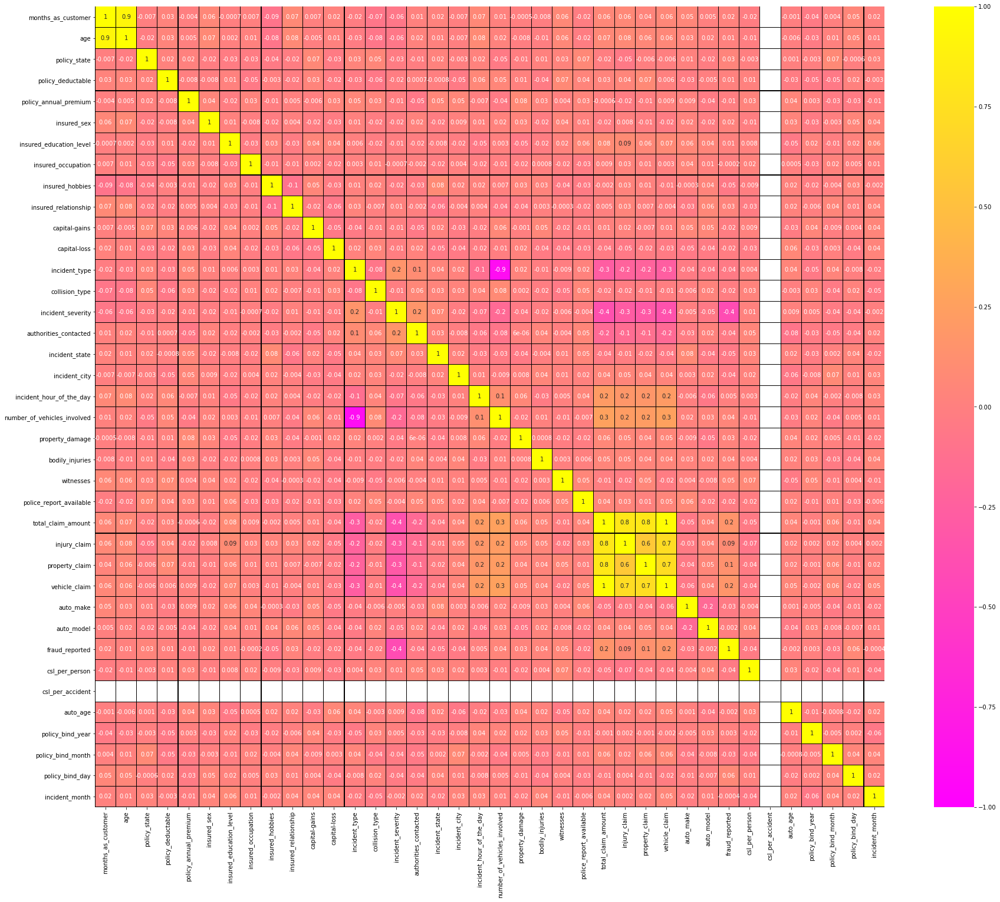

In [90]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(30,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="spring")
plt.yticks(rotation=0);

# Observations
- We can notice a multicolinearity issue between incident type and number_of_vehicles_invovled.
- There is multicolinearity issue between incident_month and incident_day.
- There is multicolinearity issue between total_claim_amount and injury_claim.
- There is multicolinearity issue between total_claim_amount and property_claim.
- There is multicolinearity issue between injury_claim and vehicle_claim.
- There is multicolinearity issue between total_claim_amount and vehicle_claim.
- There is multicolinearity issue between vehicle_claim and property_claim.
- There is multicolinearity issue between total_claim_amount and property_claim.

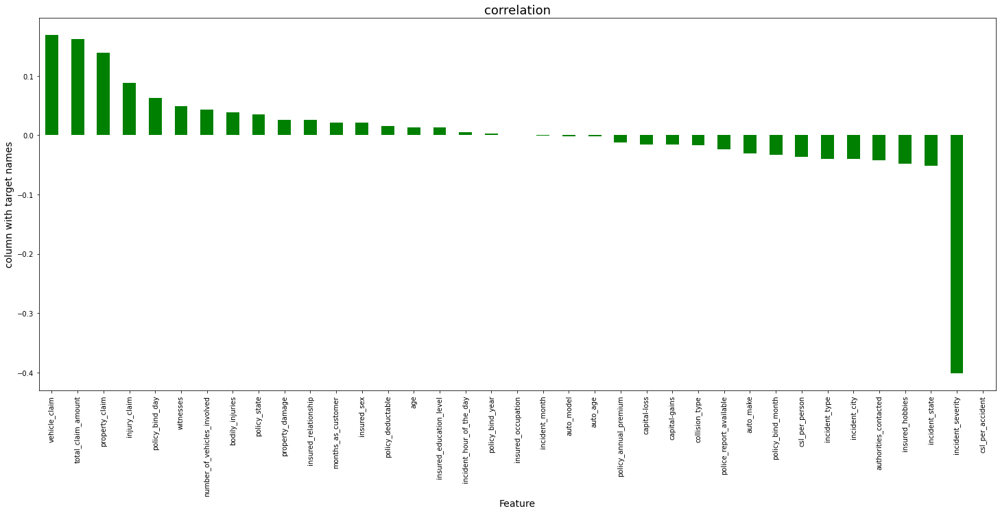

In [91]:
# Plotting bar plot of the correlation between the target and the features
plt.figure(figsize=(25,10))
df_new.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

# Observations
- The features incident_hour_of_the_day, policy_bind_year, insured_occupation, incident_month, auto_model, auto_age have least or no correlation with the target, hence these can be dropped.
- The features policy_annual_premium, capital_loss, capital_gains, collision_type, police_report_available, auto_maker, policy_bind_month, csl_per_person, incident_type, incident_city, authorities _contacted, insured_hobbies, incident_state are negatively correlated with the target.
- The feature incident_severity is highly negatively correlated to the target compared to all other features.
- Other features are positively related to the target where vehicle_claim is highly positively correlated to the target.

# Separating features and label

In [92]:
x = df_new.drop("fraud_reported",axis=1)
y = df_new["fraud_reported"]

Target and independent features have been seperated as x and y variables.

# Scaling the data

In [93]:
# Scaling the data using standard scaler
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

The data has been scaled using standard scaling

In [95]:
#Viewing the top 5 rows of the X after scaling
X.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month
0,1.070264,0.983956,1.180447,-0.225968,0.619923,1.072994,0.533151,-1.157117,1.276270,-1.438291,1.000306,0.954570,0.762554,1.345988,-1.260366,1.199279,0.352116,-0.974678,-0.958407,-0.821125,1.513918,0.001248,0.464781,1.474706,0.719485,-0.188645,1.174939,0.757816,0.852973,-1.638317,-0.134218,0.0,0.186701,1.682477,1.013847,0.173153,-1.101290
1,0.202991,0.329985,-0.024567,1.410009,-0.248937,1.072994,0.533151,-0.161169,0.924628,-0.249110,-0.906889,0.954570,1.688378,-0.029443,-0.195406,1.199279,0.815775,0.988688,-0.527848,-0.821125,-0.660538,-1.222563,-1.333838,-0.678101,-1.778833,-1.362026,-1.379994,-1.788203,0.356523,-0.650052,-0.134218,0.0,-0.311903,0.599465,-0.162827,1.306330,-1.101290
2,-0.612245,-1.086951,1.180447,1.410009,0.645737,-0.931972,1.557678,1.083766,-1.361044,0.345481,0.349069,0.954570,-1.089093,-0.029443,-0.195406,1.199279,-1.038860,-0.974678,-0.671368,1.143567,-0.660538,1.225058,1.364090,-0.678101,-0.717305,0.055042,-0.739173,-0.821553,-0.636377,0.967110,-1.063637,0.0,-0.311903,-0.212794,-0.162827,-0.733389,-0.021758
3,0.445828,0.220990,-1.229581,1.410009,0.656510,-0.931972,1.557678,-1.406105,-1.361044,0.940071,0.842864,-1.269796,0.762554,-1.404875,-1.260366,1.199279,-0.575202,-1.465520,-0.958407,-0.821125,-0.660538,0.001248,0.464781,-0.678101,0.394103,-0.223457,-0.219420,0.681441,-0.884602,1.326479,-0.134218,0.0,-1.475311,-1.566559,-0.456996,1.079695,1.557856
4,0.202991,0.547975,-1.229581,-0.225968,1.353331,1.072994,-1.515903,1.083766,-1.361044,0.940071,1.454740,-0.685187,1.688378,-0.029443,-0.195406,-0.105037,-1.038860,-1.465520,1.194388,-0.821125,-0.660538,-1.222563,-0.434529,-0.678101,-1.731679,-1.255541,-1.407130,-1.741666,-1.629278,1.056952,1.414814,0.0,-0.644305,1.682477,-0.162827,-1.073342,-0.021758


# Checking multicolinearity using VIF

In [97]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,6.905699,months_as_customer
1,6.916360,age
2,1.035351,policy_state
3,1.047257,policy_deductable
4,1.036584,policy_annual_premium
5,1.031178,insured_sex
6,1.047903,insured_education_level
7,1.016859,insured_occupation
8,1.050061,insured_hobbies
9,1.042705,insured_relationship


In [98]:
#Droping high VIF columns
X = X.drop(["total_claim_amount"],axis=1)

In [99]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,6.903107,months_as_customer
1,6.916337,age
2,1.035321,policy_state
3,1.045791,policy_deductable
4,1.035751,policy_annual_premium
5,1.028458,insured_sex
6,1.047835,insured_education_level
7,1.016059,insured_occupation
8,1.048138,insured_hobbies
9,1.042694,insured_relationship


In [100]:
#Droping irrelevant columns
X = X.drop(["csl_per_accident"],axis=1)

In [101]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,6.903107,months_as_customer
1,6.916337,age
2,1.035321,policy_state
3,1.045791,policy_deductable
4,1.035751,policy_annual_premium
5,1.028458,insured_sex
6,1.047835,insured_education_level
7,1.016059,insured_occupation
8,1.048138,insured_hobbies
9,1.042694,insured_relationship


In [102]:
#Droping high VIF age column
X = X.drop(["age"],axis=1)

In [103]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,1.049231,months_as_customer
1,1.034413,policy_state
2,1.045789,policy_deductable
3,1.034548,policy_annual_premium
4,1.026330,insured_sex
5,1.047788,insured_education_level
6,1.015660,insured_occupation
7,1.048079,insured_hobbies
8,1.042315,insured_relationship
9,1.037300,capital-gains


Now the multicolinearity issue has been resolved

# Balancing the target using oversampling techniques

In [105]:
#Checking the value count of target column
y.value_counts()

0    741
1    240
Name: fraud_reported, dtype: int64

In [106]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X, y = SM.fit_resample(X,y)

In [107]:
# Checking the value counts again
y.value_counts()

0    741
1    741
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

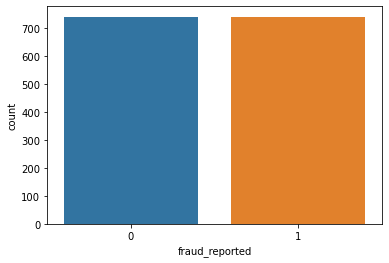

In [108]:
# Visualizing the target data after oversampling
sns.countplot(y)

This shows the data is balanced

# Finding Best Random State and Accuracy

In [109]:
#importing necessary libraries
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [110]:
from sklearn.ensemble import ExtraTreesClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = ExtraTreesClassifier()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9370786516853933  on Random_state  81


Got the best accuracy and random state.

In [111]:
# Creating train and test split.
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

# Classification Algorithms

In [112]:
#importing necessary libraries.
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, accuracy_score

## i) RandomForestClassifier

In [113]:
RFC=RandomForestClassifier()
RFC.fit(X_train,y_train)
predrf=RFC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predrf))
print('Confusion Matrix:',confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))

Accuracy Score: 0.898876404494382
Confusion Matrix: [[194  26]
 [ 19 206]]
              precision    recall  f1-score   support

           0       0.91      0.88      0.90       220
           1       0.89      0.92      0.90       225

    accuracy                           0.90       445
   macro avg       0.90      0.90      0.90       445
weighted avg       0.90      0.90      0.90       445



RFC is giving 89.88% accuracy.

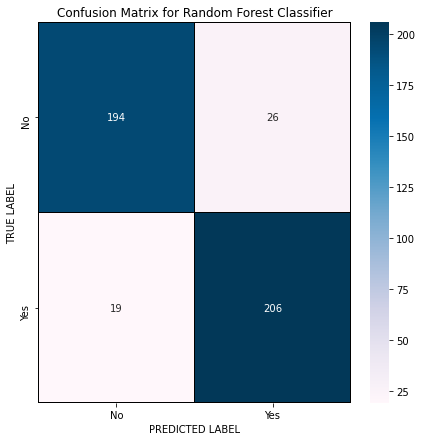

In [114]:
cm = confusion_matrix(y_test, predrf)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

We can see the true values and predicted values in Random Forest Classifier model using confusion matrix.

## ii) DecisionTreeClassifier

In [123]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train,y_train)
pred_dtc=DTC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, pred_dtc))
print('Confusion Matrix:',confusion_matrix(y_test, pred_dtc))
print(classification_report(y_test,pred_dtc))

Accuracy Score: 0.8
Confusion Matrix: [[179  41]
 [ 48 177]]
              precision    recall  f1-score   support

           0       0.79      0.81      0.80       220
           1       0.81      0.79      0.80       225

    accuracy                           0.80       445
   macro avg       0.80      0.80      0.80       445
weighted avg       0.80      0.80      0.80       445



DTC is giving 80% accuracy

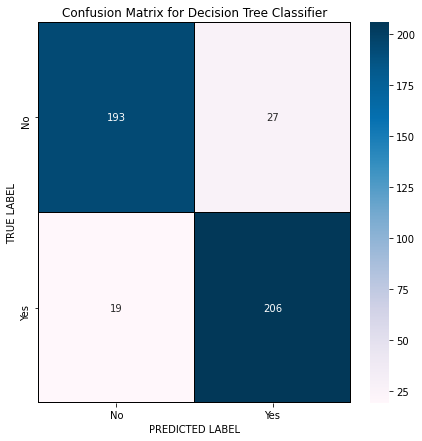

In [124]:
cm = confusion_matrix(y_test, predsv)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

We can see the true values and predicted values in Decision tree Classifier Classifier model using confusion matrix.

## iii) SupportVectorClassifier

In [121]:
SV=SVC()
SV.fit(X_train,y_train)
predsv=SV.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predsv))
print('Confusion Matrix:',confusion_matrix(y_test, predsv))
print(classification_report(y_test,predsv))

Accuracy Score: 0.8966292134831461
Confusion Matrix: [[193  27]
 [ 19 206]]
              precision    recall  f1-score   support

           0       0.91      0.88      0.89       220
           1       0.88      0.92      0.90       225

    accuracy                           0.90       445
   macro avg       0.90      0.90      0.90       445
weighted avg       0.90      0.90      0.90       445



SVC is giving 89.66% accuracy

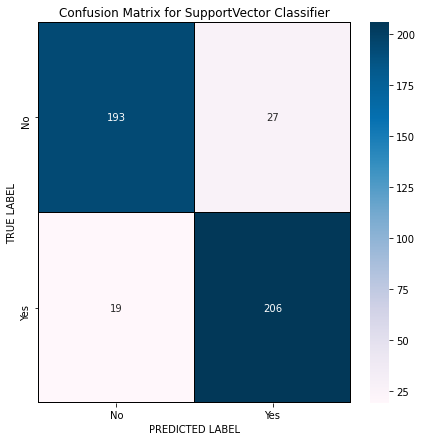

In [122]:
cm = confusion_matrix(y_test, predsv)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for SupportVector Classifier')
plt.show()

We can see the true values and predicted values in Support Vector Classifier Classifier model using confusion matrix.

## iv) XGB Classifier

In [115]:
XGB=XGBClassifier(verbosity=0)
XGB.fit(X_train,y_train)
predxg=XGB.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predxg))
print('Confusion Matrix:',confusion_matrix(y_test, predxg))
print(classification_report(y_test,predxg))

Accuracy Score: 0.8921348314606742
Confusion Matrix: [[195  25]
 [ 23 202]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       220
           1       0.89      0.90      0.89       225

    accuracy                           0.89       445
   macro avg       0.89      0.89      0.89       445
weighted avg       0.89      0.89      0.89       445



XGB is giving 89.21% accuracy.

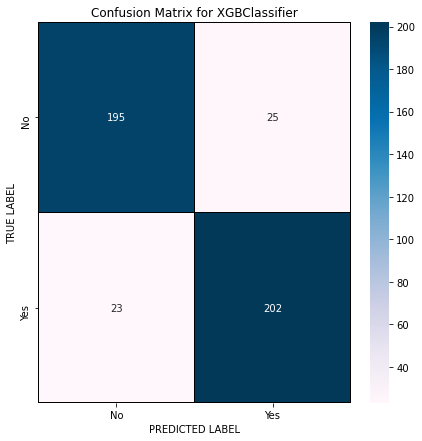

In [116]:
cm = confusion_matrix(y_test, predxg)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGBClassifier')
plt.show()

We can see the true values and predicted values in XGB Classifier model using confusion matrix.

## v) ExtraTreeClassifier

In [117]:
ETC=ExtraTreesClassifier()
ETC.fit(X_train,y_train)
predet=ETC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predet))
print('Confusion Matrix:',confusion_matrix(y_test, predet))
print(classification_report(y_test,predet))

Accuracy Score: 0.9280898876404494
Confusion Matrix: [[197  23]
 [  9 216]]
              precision    recall  f1-score   support

           0       0.96      0.90      0.92       220
           1       0.90      0.96      0.93       225

    accuracy                           0.93       445
   macro avg       0.93      0.93      0.93       445
weighted avg       0.93      0.93      0.93       445



ETC is giving 92.80% accuracy

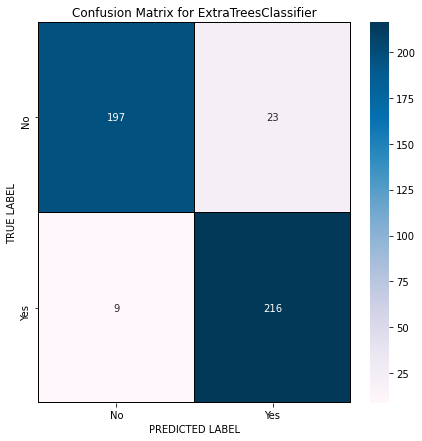

In [118]:
cm = confusion_matrix(y_test, predet)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTreesClassifier')
plt.show()

We can see the true values and predicted values in Extra Tree Classifier model using confusion matrix.

## vi) Gradient Boosting Classifier

In [119]:
GBC=GradientBoostingClassifier()
GBC.fit(X_train,y_train)
predgb=GBC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predgb))
print('Confusion Matrix:',confusion_matrix(y_test, predgb))
print(classification_report(y_test,predgb))

Accuracy Score: 0.8719101123595505
Confusion Matrix: [[191  29]
 [ 28 197]]
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       220
           1       0.87      0.88      0.87       225

    accuracy                           0.87       445
   macro avg       0.87      0.87      0.87       445
weighted avg       0.87      0.87      0.87       445



GBC is giving 87% accuracy.

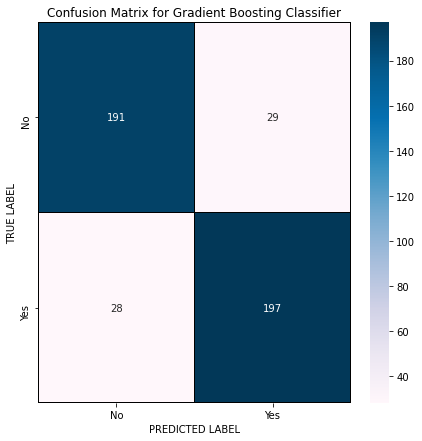

In [120]:
cm = confusion_matrix(y_test, predgb)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

We can see the true values and predicted values in Gradient Boosting Classifier model using confusion matrix.

# Cross validation scores

In [125]:
#Importing library
from sklearn.model_selection import cross_val_score

In [126]:
# cv score for Random Forest Classifier
print(cross_val_score(RFC,X,y,cv=5).mean())

0.8759623259623259


In [127]:
# cv score for DTC Classifier
print(cross_val_score(DTC,X,y,cv=5).mean())

0.8340977340977341


In [128]:
# cv score for Support vector Classifier
print(cross_val_score(SV,X,y,cv=5).mean())

0.8637455637455638


In [129]:
# cv score for XGB Classifier
print(cross_val_score(XGB,X,y,cv=5).mean())

0.8887637637637639


In [130]:
# cv score for Extra Trees Classifier
print(cross_val_score(ETC,X,y,cv=5).mean())

0.9177450177450177


In [131]:
# cv score for Gradient Boosting Classifier
print(cross_val_score(GBC,X,y,cv=5).mean())

0.8793088543088542


Above are the cross validation scores of RFC, XGB, ETC, GBC and SV.

Difference between the model accuracy and cross validation score are:

- RFC -  2.29%
- DTC - -3.40%
- SV  -  3.29%
- XGB -  0.34%
- ETC -  1.03%
- GBC - -0.74.8%

So by looking into the difference of model accuracy and cross validation score we know ExtraTreesClassifier is the best model.

# ROC-AUC curve

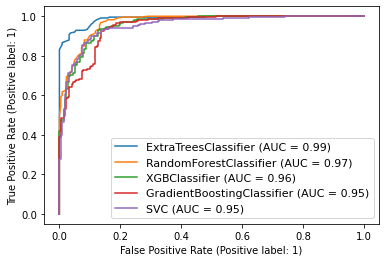

In [132]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 
disp = plot_roc_curve(ETC,X_test,y_test)
plot_roc_curve(RFC, X_test, y_test, ax=disp.ax_)     # ax_=Axes with confusion matrix
plot_roc_curve(XGB, X_test, y_test, ax=disp.ax_)
plot_roc_curve(GBC, X_test, y_test, ax=disp.ax_)
plot_roc_curve(SV, X_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

Above is the ROC curves for all the models that have been predicted. And the AUC values can also be seen in the plot. This confirms Extra trees Classier as the best model

# Hyper Parameter tuning

In [133]:
#importing necessary libraries
from sklearn.model_selection import GridSearchCV

In [134]:
#Giving the parameters list for ETC model
parameter = {'criterion':['gini','entropy'],
             'max_depth': [10,12,15,20,22],
             'n_estimators':[500,700,1000,1200],
             'max_features':['aoto','sqrt','log2'],
             'min_samples_split': [2]}

In [135]:
# Running grid search CV for ETC
GCV=GridSearchCV(ExtraTreesClassifier(),parameter,cv=5)

In [136]:
# Training the model with GCV
GCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 12, 15, 20, 22],
                         'max_features': ['aoto', 'sqrt', 'log2'],
                         'min_samples_split': [2],
                         'n_estimators': [500, 700, 1000, 1200]})

In [137]:
# Getting the best parameters for ETC
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 22,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 1200}

In [138]:
Final_model=ExtraTreesClassifier(criterion='gini', max_depth=22, max_features='log2', min_samples_split=2, n_estimators=1200)
Final_model.fit(X_train,y_train)
pred=Final_model.predict(X_test)
acc=accuracy_score(y_test, pred)

print('Accuracy Score:',(accuracy_score(y_test,pred)*100))
print('Confusion matrix:',confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy Score: 93.48314606741573
Confusion matrix: [[197  23]
 [  6 219]]
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       220
           1       0.90      0.97      0.94       225

    accuracy                           0.93       445
   macro avg       0.94      0.93      0.93       445
weighted avg       0.94      0.93      0.93       445



# AUC ROC CURVE for final model

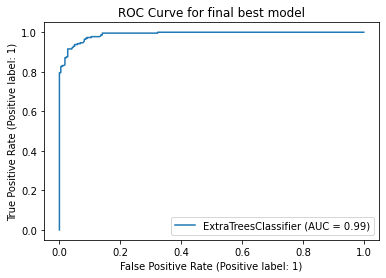

In [140]:
#Ploting ROC curve for final best model
plot_roc_curve(Final_model, X_test, y_test)
plt.title('ROC Curve for final best model')
plt.show()

After hyperparameter tuning we got improvement in roc curve and AUC. 99% AUC is best accuracy.

# Saving the model

In [141]:
#Saving the model as .pkl file
import joblib
joblib.dump(Final_model,"Insurance_Claim_Fraud.pkl")

['Insurance_Claim_Fraud.pkl']

We have saved the final best model as Insurance_Claim_Fraud using .pkl method

# Predictions

In [142]:
# Loading the saved model
model=joblib.load("Insurance_Claim_Fraud.pkl")

#Prediction
prediction = model.predict(X_test)
prediction

array([1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,

In [143]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444
Predicted,1,1,0,1,0,1,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,0,0,0,0,1,0,1,1,1,1,0,1,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,1,1,0,0,0,1,0,1,0,1,1,0,0,1,1,1,0,1,0,0,0,1,1,1,0,0,1,0,1,1,1,0,0,0,1,1,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,0,1,0,1,0,1,1,1,0,1,1,1,1,0,0,1,1,0,0,1,0,1,0,0,1,0,0,1,0,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,0,0,1,0,1,0,1,0,1,0,1,1,1,0,1,0,0,0,1,1,0,1,0,1,0,0,0,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,0,0,0,0,0,0,1,1,1,1,1,1,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,0,1,0,0,1,1,1,1,1,1,0,1,1,0,0,0,0,1,0,0,1,1,1,0,1,1,0,0,1,1,1,0,1,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,1,1,0,1,0,0,0,0,1,1,1,0,1,0,0,1,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,1,0,1,1,1,1,1,1,0,1,0,1,1,1,0,1,0,1,0,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0,1,0,1,0,1,0,0,1,0,1,1,1,1,0,1,1,1,0,0,1,0,0,0,1,1,1,1,0,0,1,1,1,1,1,0,0,0,1,0,1,1,0,1,1,0,1,0,1
Actual,1,1,0,1,0,1,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,0,0,1,0,0,0,0,1,0,1,1,1,1,0,1,0,0,0,1,0,0,0,1,0,0,1,1,0,1,0,1,1,1,0,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,0,0,1,1,1,0,0,1,0,1,1,1,0,0,0,1,1,1,0,1,1,1,1,1,0,0,1,0,1,1,1,1,0,0,0,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,0,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,1,1,0,0,0,1,0,1,0,1,1,1,0,0,0,0,0,1,0,1,0,1,1,1,0,1,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,0,1,1,1,0,0,0,0,0,0,1,1,1,1,1,1,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,0,1,1,0,1,1,1,0,1,0,0,0,1,1,1,1,1,0,0,1,0,0,0,0,1,0,0,1,1,1,0,1,1,0,0,1,1,1,0,1,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,1,1,0,1,0,0,0,0,1,1,1,0,1,0,0,1,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,1,0,1,1,0,1,1,1,0,1,0,1,1,1,0,1,0,1,0,1,1,1,1,1,1,0,0,1,1,1,1,0,0,0,1,1,1,0,0,0,1,0,1,0,0,1,0,1,1,1,1,0,1,0,1,0,0,1,0,0,0,1,1,1,1,0,0,1,1,1,1,1,0,0,0,1,0,1,1,0,1,1,0,1,0,1


Above are the predicted values and the actual values.They look similar.

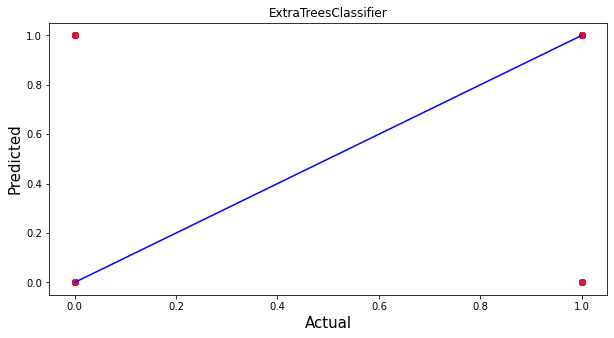

In [144]:
# Plotting Actual vs Predicted to get better insights
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("ExtraTreesClassifier")
plt.show()

The predicted values are in sync with the Actual values